![image-2.png](attachment:image-2.png)
_Aprendizaje Automático_

_Máster Universitario en Inteligencia Artificial_

# Actividad grupal: Explorando patrones ocultos: Detección de Anomalías en datos
## Objetivos

Mediante este trabajo se pretende que ponga en práctica la aplicación de las técnicas de detección de anomalías. El objetivo es analizar si existen anomalías en el conjunto de datos aplicando técnicas univariantes y multivariantes. Debe detallar los pasos que hay que realizar para detección de valores inusuales.

- 	Entender los métodos media móvil, z-score, Isolation Forest y Local Outlier Factor
- 	Implementar el código para cada una de estas técnicas y analizar si existen o no anomalía
- 
	Investigar sobre una técnica de detección de anomalías con un caso de uso concreto.

Descripción de la actividad

Debes realizar la actividad en el Notebook adjunto. Debes ir completando el código solicitado, así como responder a las preguntas que se van realizando.

Tareas que
- alizar
	Detección de 
- malías.
	Debes completar el código pedido en este notebook y contestar las pregunt
- finales.
	Buscar dos artículos científicos (https://scholar.google.es/) con un caso de uso de detección de anomalías. Los artículos deben estar en revistas científicas, y deben ser posteriores a 2015. No debe utilizar técnicas de De
- Learning.
	Para cada artí
- O indicar:
o	Objetivo: cuál es el objetivo de la investigación, es decir a qué problema real está aplicando la detección
-  anomalías.
o	Técnicas de detección de anoma
- s empleadas.
o	Principales resultados de la aplicación y de la investigación.


#### Integrantes del grupo

# viviana noelia gutierrez gallotti
# javier marcelo sepulveda spielmann
# julio cesar contreras huerta
# mariano ortega de mues

## Detección de anomalías

Los transformadores juegan un papel muy importante en el sistema eléctrico. Aunque son algunos de los componentes más confiables de la red eléctrica, también son propensos a fallar debido a muchos factores, tanto internos como externos. Podría haber muchos iniciadores que causen una falla en el transformador, pero los que potencialmente pueden conducir a una falla catastrófica son los siguientes:
Falla mecánica
Falla dieléctrica

Contenido
Estos datos se recopilaron a través de dispositivos IoT desde el 25 de junio de 2019 hasta el 14 de abril de 2020 y se actualizaron cada 15 minutos.
El dataset contiene 19352 registros.
Descripción de los parámetros:
Voltaje de corriente:
1. VL1- Fase Línea 1
2. VL2- Fase Línea 2
3. VL3- Fase Línea 3
4. IL1- Línea actual 1
5. IL2- Línea actual 2
6. IL3- Línea actual 3
7. VL12- Línea de tensión 1 2
8. VL23- Línea de tensión 2 3
9. VL31- Línea de tensión 3 1
10. INUT-Corriente neutra

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

# se carga el dataset, con separados ;, se transforman las dos columnas Date y Time a una única columna con tipo datetime
# en el fichero CSV existen NaN identificados por ?
df = pd.read_csv('CurrentVoltage.csv', sep=',') 

#### ¿Cuántas instancias tiene el dataset?

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19352 entries, 0 to 19351
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   DeviceTimeStamp  19352 non-null  object 
 1   VL1              19352 non-null  float64
 2   VL2              19352 non-null  float64
 3   VL3              19352 non-null  float64
 4   IL1              19352 non-null  float64
 5   IL2              19352 non-null  float64
 6   IL3              19352 non-null  float64
 7   VL12             19352 non-null  float64
 8   VL23             19352 non-null  float64
 9   VL31             19352 non-null  float64
 10  INUT             19352 non-null  float64
dtypes: float64(10), object(1)
memory usage: 1.6+ MB


### El dataset contiene 19352 instancias.

#### ¿Cuál es el tipo de datos predominante en las variables?

### El tipo de datos predominante es float64.

## Variables nulas

#### ¿Tiene este dataset datos faltantes?

In [3]:
print(df.isnull().any())

DeviceTimeStamp    False
VL1                False
VL2                False
VL3                False
IL1                False
IL2                False
IL3                False
VL12               False
VL23               False
VL31               False
INUT               False
dtype: bool


### Este dataset no presenta filas con datos faltantes.

#### ¿Es necesario hacer algún tratamiendo adicional sobre los datos?

In [4]:
df.describe()

,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
count,19352.000000,19352.000000,19352.000000,19352.000000,19352.000000,19352.000000,19352.00000,19352.000000,19352.000000,19352.000000
mean,241.068019,240.515456,239.912293,73.710857,58.970592,83.226555,379.47530,378.526261,379.969311,26.315187
std,9.536380,9.801129,8.846213,41.256800,40.463867,43.609360,119.96308,119.417113,120.074752,15.103268
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,235.400000,235.100000,235.100000,46.775000,31.500000,56.300000,400.70000,401.300000,401.900000,16.800000
50%,242.700000,242.100000,241.100000,69.500000,50.200000,80.200000,417.80000,416.300000,417.900000,25.600000
75%,247.500000,246.700000,245.300000,100.100000,82.500000,113.900000,427.50000,425.300000,427.600000,35.700000
max,261.200000,261.300000,261.300000,224.100000,253.600000,247.300000,446.50000,444.800000,447.300000,145.800000


In [5]:
df.tail(20)

,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
19332,2020-04-13T19:45,242.3,240.7,240.1,82.2,40.6,92.3,419.1,415.1,419.0,47.7
19333,2020-04-13T20:00,242.7,241.1,240.6,81.0,42.3,88.5,419.7,416.0,419.9,43.1
19334,2020-04-13T20:15,243.3,241.7,241.4,81.9,41.3,89.9,420.7,417.0,421.1,45.0
19335,2020-04-13T20:30,243.6,241.5,241.2,77.2,47.3,97.8,420.7,416.7,421.3,44.4
19336,2020-04-13T20:45,243.8,242.0,242.0,81.8,51.7,92.3,421.3,417.7,422.2,39.5
19337,2020-04-13T21:00,243.1,241.4,241.0,85.3,52.8,89.3,420.3,416.6,420.5,34.2
19338,2020-04-13T21:15,243.1,241.6,241.2,81.4,49.7,91.2,420.4,416.8,421.0,37.8
19339,2020-04-13T21:30,243.3,241.6,241.1,75.7,46.0,101.6,420.5,416.7,420.9,48.1
19340,2020-04-13T21:45,244.2,242.3,241.7,84.4,48.5,97.0,422.1,417.8,422.0,43.5
19341,2020-04-13T22:00,244.0,242.2,241.7,83.3,51.6,97.2,421.8,417.8,421.9,40.4


In [6]:
# Convertir la columna a datetime
df['DeviceTimeStamp'] = pd.to_datetime(df['DeviceTimeStamp'])

# Ordenamos en base a la fecha de adquisicion
df = df.sort_values(by='DeviceTimeStamp')

### Transformamos la fecha en Datatime y ordenamos.

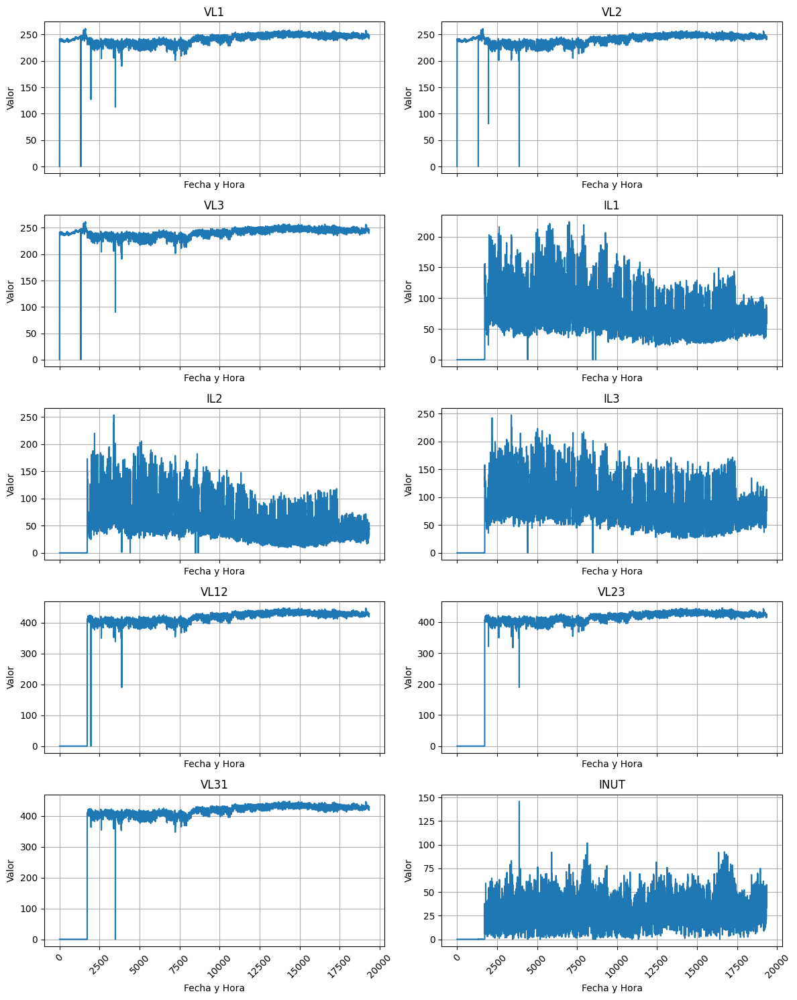

In [7]:


# 3. Seleccionar las columnas desde la 1 hasta la 10
columnas_a_graficar = df.columns[1:11]

# 4. Configurar la cuadrícula de subplots
num_columnas = 2  # Número de columnas en la cuadrícula de subplots
num_filas = 5     # Número de filas en la cuadrícula de subplots

fig, axes = plt.subplots(num_filas, num_columnas, figsize=(12, 15), sharex=True)

# Aplanar el array de ejes para iterar fácilmente
axes = axes.flatten()

# 5. Graficar cada variable en su subplot correspondiente
for i, columna in enumerate(columnas_a_graficar):
    
    axes[i].plot(df.index, df[columna])
    axes[i].set_title(columna)
    axes[i].set_xlabel('Fecha y Hora')
    axes[i].set_ylabel('Valor')
    axes[i].grid(True)
    axes[i].tick_params(axis='x', rotation=45)  # Rotar etiquetas del eje X para mejor legibilidad

# Si hay subplots adicionales, eliminarlos
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el layout para evitar superposiciones
plt.tight_layout()

# Mostrar el gráfico
plt.show()

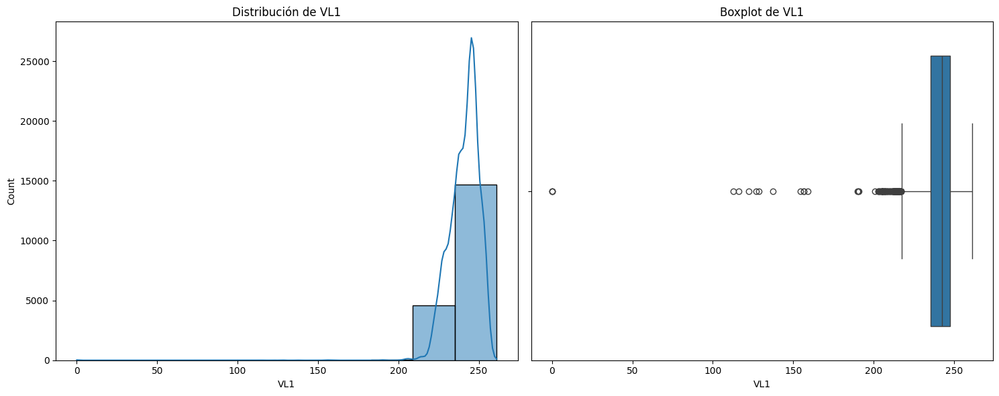

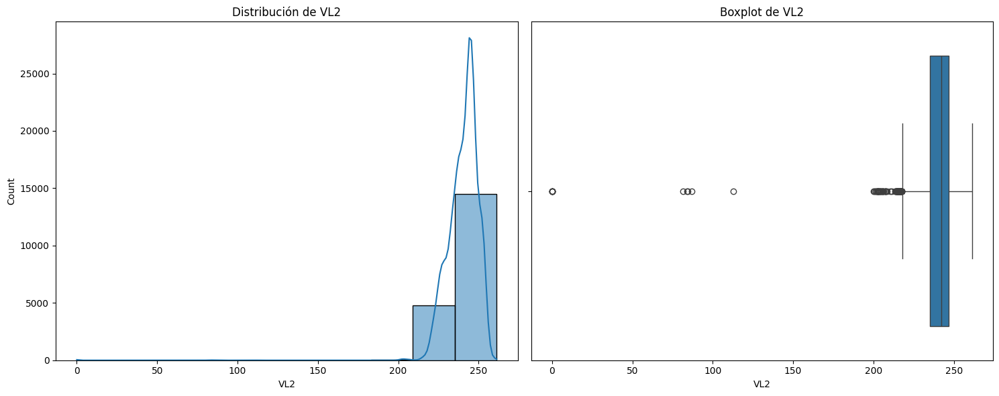

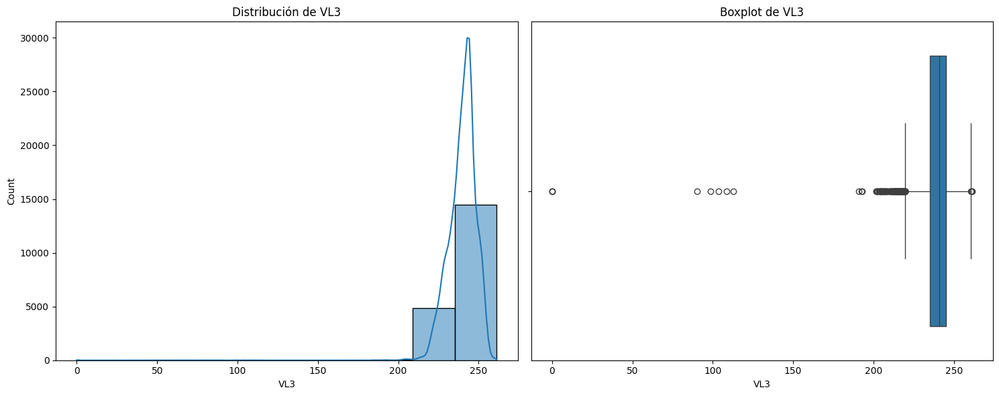

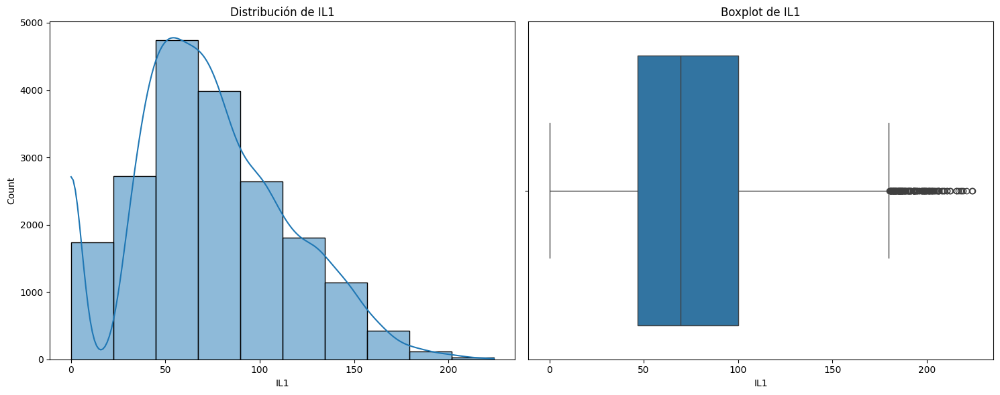

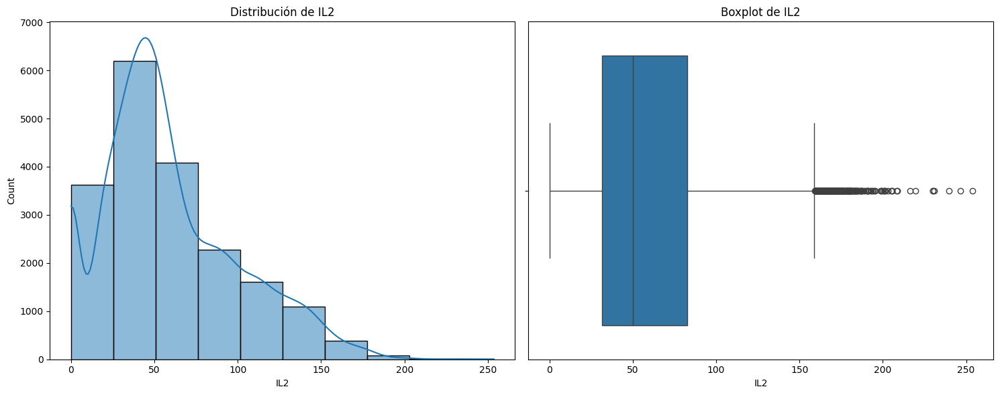

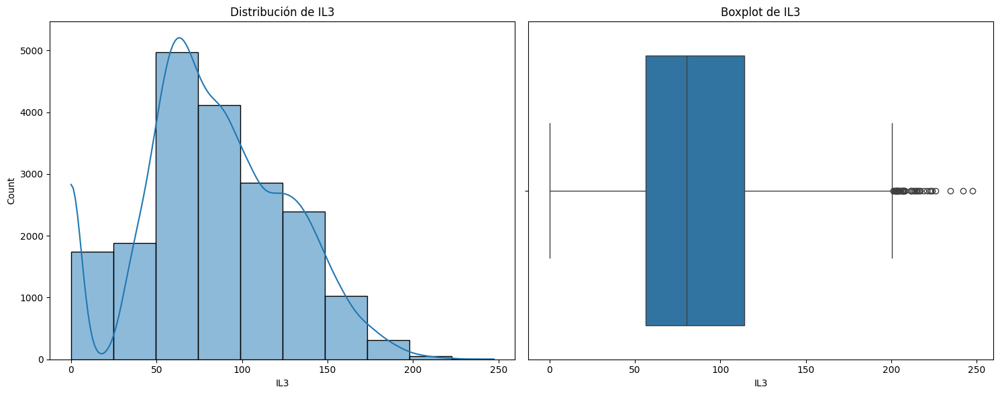

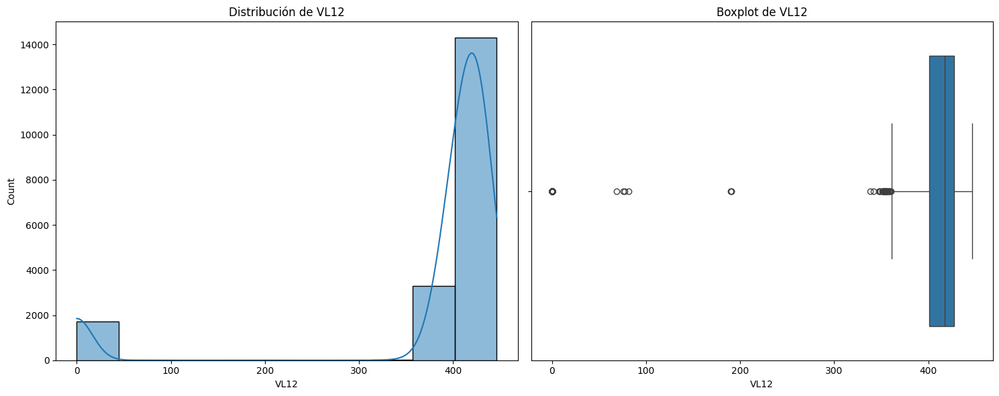

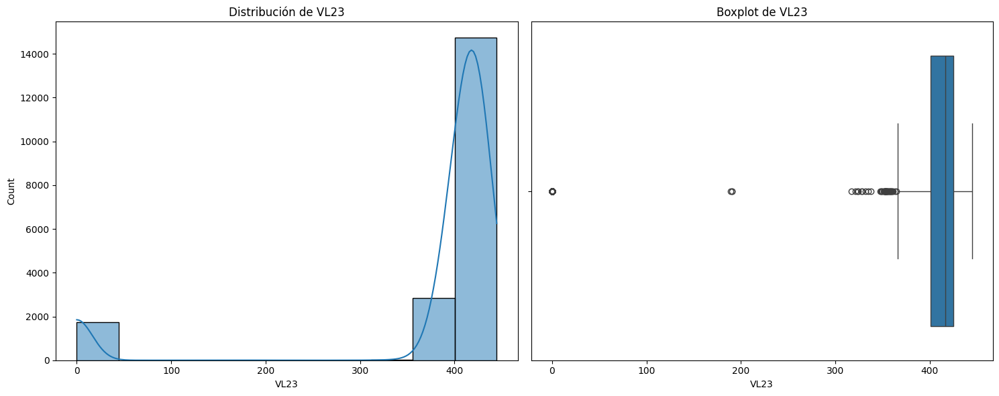

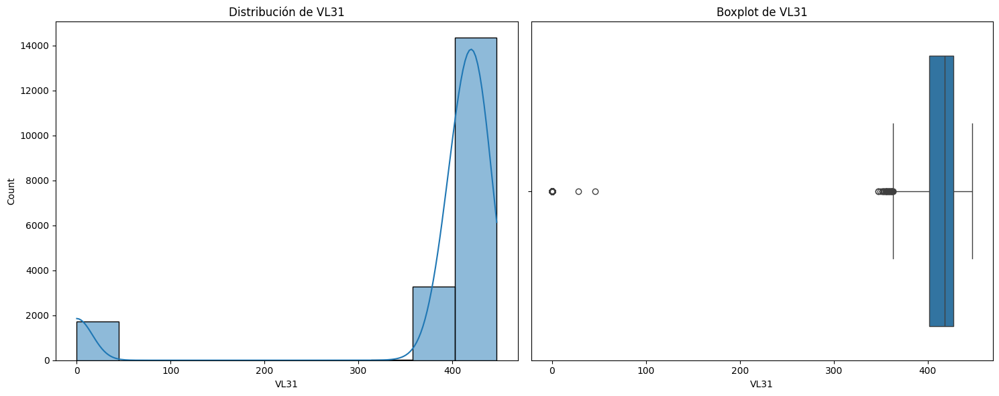

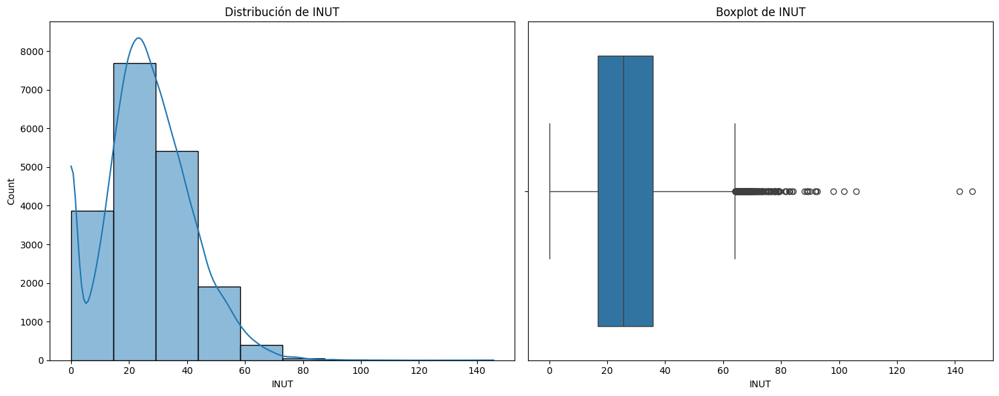

In [8]:
for col in df.select_dtypes(include=['number']).columns:
    # Crear una figura
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Histograma para la columna
    sns.histplot(df[col], kde=True, ax=axes[0], bins=10)
    axes[0].set_title(f'Distribución de {col}')

    # Boxplot para la columna
    sns.boxplot(x=df[col], ax=axes[1])
    axes[1].set_title(f'Boxplot de {col}')

    # Mostrar los gráficos
    plt.tight_layout()
    plt.show()

    

### Aunque las distribuciones presentan outliers, no los eliminamos para poder estudiarlos de forma correcta.

In [9]:
# Calcular la diferencia de tiempo entre mediciones consecutivas
df['DiferenciaTiempo'] = df['DeviceTimeStamp'].diff()

# Filtrar periodos sin medidas mayores a un umbral (ejemplo: 1 hora)
umbral_tiempo = pd.Timedelta(hours=1)
periodos_sin_medidas = df[df['DiferenciaTiempo'] > umbral_tiempo][['DeviceTimeStamp', 'DiferenciaTiempo']]

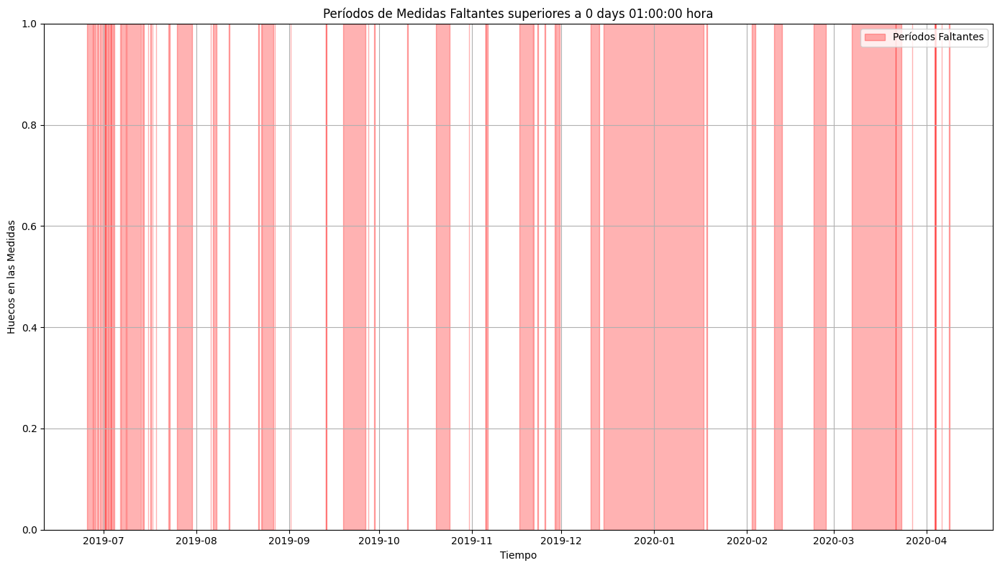

In [10]:

# Configurar el gráfico
plt.figure(figsize=(14, 8))

# Resaltar períodos faltantes
for _, row in periodos_sin_medidas.iterrows():
    plt.axvspan(row['DeviceTimeStamp'] - row['DiferenciaTiempo'], row['DeviceTimeStamp'], color='red', alpha=0.3, label='Periodo Faltante')

# Etiquetas y leyenda
plt.title(f'Períodos de Medidas Faltantes superiores a {umbral_tiempo} hora')
plt.xlabel('Tiempo')
plt.ylabel('Huecos en las Medidas')
plt.legend(['Períodos Faltantes'], loc='upper right')
plt.grid(True)
plt.tight_layout()

# Mostrar el gráfico
plt.show()

In [11]:

# Filtrar periodos sin medidas mayores a un umbral (ejemplo: 1 hora)
umbral_tiempo = pd.Timedelta(hours=1)
periodos_sin_medidas = df[df['DiferenciaTiempo'] > umbral_tiempo]

# Calcular el número total de períodos faltantes
numero_periodos_faltantes = len(periodos_sin_medidas)

# Crear una tabla resumen
tabla_resumen = pd.DataFrame({
    'TotalPeriodosFaltantes': [numero_periodos_faltantes],
    'UmbralTiempo': [umbral_tiempo]
})

# Mostrar la tabla resumen
print(f'Periodos faltantes de mas de {umbral_tiempo} horas')
print(tabla_resumen)


df=df.drop('DiferenciaTiempo',axis=1)


Periodos faltantes de mas de 0 days 01:00:00 horas
   TotalPeriodosFaltantes    UmbralTiempo
0                      60 0 days 01:00:00


Tras ordenar los datos temporalmente, encontramos 60 peridos con huecos en alguna variable mayores de 1 hora. Esto puede ser debido a problemas del meter para adquirir la medida o problemas como la comunicacion y el envio de la misma.

#### Media móvil

### Vamos a aplicar la técnica de detección de anomalías de Media Móvil sobre la variable INUT

In [12]:

# Aplicar media móvil a la columna INUT
ventana_media_movil = 4  # Tamaño de la ventana para la media móvil
df['INUT_MediaMovil'] = df['INUT'].rolling(window=ventana_media_movil, min_periods=1).mean()

# Calcular un umbral habitual: media + 3 veces la desviación estándar
media_inut = df['INUT_MediaMovil'].mean()
desviacion_inut = df['INUT_MediaMovil'].std()
# Calcular los umbrales superior e inferior
umbral_superior = media_inut + 3 * desviacion_inut  

# Identificar anomalías
df['Anomalia'] = (df['INUT_MediaMovil'] > umbral_superior) 

df.head()


,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT,INUT_MediaMovil,Anomalia
0,2019-06-25 13:06:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,2019-06-27 10:49:00,238.7,238.7,238.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
2,2019-06-27 10:51:00,238.4,238.5,238.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
3,2019-06-27 10:52:00,239.9,240.0,240.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
4,2019-06-27 10:52:00,239.9,240.0,240.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False


In [13]:
numero_anomalias = df['Anomalia'].sum()
print(f'Número de anomalías detectadas con Media Movil: {numero_anomalias}')

Número de anomalías detectadas con Media Movil: 53


In [14]:
import plotly.graph_objects as go

# Crear la figura
fig = go.Figure()

# Graficar la media móvil
fig.add_trace(go.Scatter(
    x=df.index,
    y=df['INUT_MediaMovil'],
    mode='lines',
    name='Media Móvil (INUT)',
    line=dict(color='blue')
))

# Graficar las anomalías
anomalias = df[df['Anomalia']]
fig.add_trace(go.Scatter(
    x=anomalias.index,
    y=anomalias['INUT_MediaMovil'],
    mode='markers',
    name='Anomalías',
    marker=dict(color='red', size=8)
))

# Agregar líneas auxiliares para los umbrales
fig.add_trace(go.Scatter(
    x=df.index,
    y=[umbral_superior] * len(df),
    mode='lines',
    name='Umbral Superior',
    line=dict(color='orange', dash='dash')
))

# Configurar el layout
fig.update_layout(
    title=f'Detección de Anomalías en INUT(Media Movil,ventana={ventana_media_movil})',
    xaxis_title='Índice de Tiempo',
    yaxis_title='INUT Media Móvil',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    template='plotly_white'
)

# Mostrar el gráfico
fig.show()


In [15]:
# Presentamos un resumen de los datos normales y anómalos
resumen_media = df['Anomalia'].value_counts().rename({0: 'Normales', 1: 'Anómalos'})
print(resumen_media)

Normales    19299
Anómalos       53
Name: Anomalia, dtype: int64


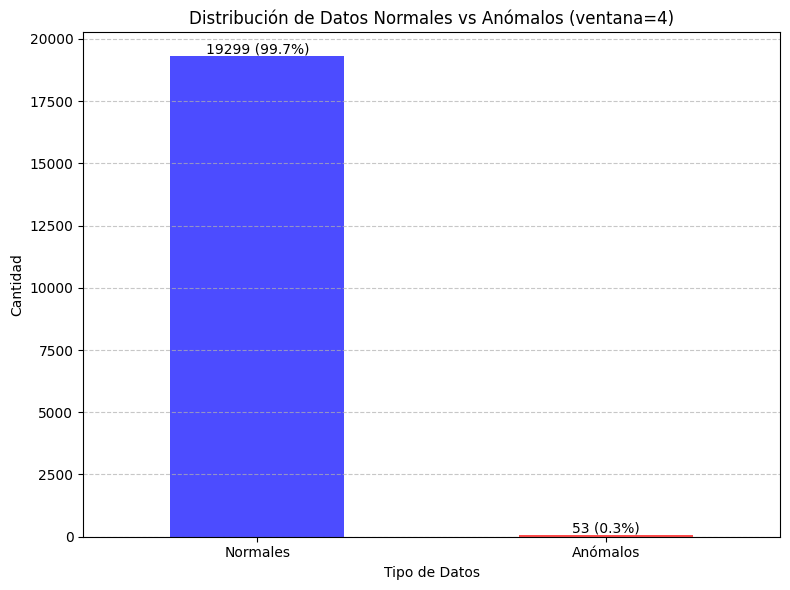

In [16]:
import matplotlib.pyplot as plt

# Crear el gráfico de barras
plt.figure(figsize=(8, 6))
ax = resumen_media.plot(kind='bar', color=['blue', 'red'], alpha=0.7)

# Calcular el total de datos
total = resumen_media.sum()

# Agregar el valor y el porcentaje en la parte superior de cada barra
for p in ax.patches:
    height = p.get_height()
    percentage = (height / total) * 100  # Calcular el porcentaje
    ax.annotate(
        f'{int(height)} ({percentage:.1f}%)',  # Valor + porcentaje
        (p.get_x() + p.get_width() / 2., height),  # Posición del texto
        ha='center', va='bottom', fontsize=10, color='black'
    )

# Personalizar el gráfico
plt.title(f'Distribución de Datos Normales vs Anómalos (ventana={ventana_media_movil})')
plt.ylabel('Cantidad')
plt.xlabel('Tipo de Datos')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [17]:
import matplotlib.cm as cm

# Crear una nueva columna con el día de la semana codificado
df['DiaSemana'] = df['DeviceTimeStamp'].dt.weekday + 1

# Lista de nombres de los días de la semana
nombres_dias = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Crear un mapa de colores basado en los nombres de los días de la semana
colores = cm.rainbow(np.linspace(0, 1, 7))
dias_semana_colores = {i + 1: f'rgba({int(c[0]*255)}, {int(c[1]*255)}, {int(c[2]*255)}, {c[3]})' for i, c in enumerate(colores)}

# Crear la figura
fig = go.Figure()

# Graficar la media móvil
fig.add_trace(go.Scatter(
    x=df.index,
    y=df['INUT_MediaMovil'],
    mode='lines',
    name='Media Móvil (INUT)',
    line=dict(color='blue')
))

# Graficar las anomalías con colores por día de la semana
anomalias = df[df['Anomalia']]
for dia, color in dias_semana_colores.items():
    subset_anomalias = anomalias[anomalias['DiaSemana'] == dia]
    nombre_dia = nombres_dias[dia - 1]  # Obtener el nombre del día
    fig.add_trace(go.Scatter(
        x=subset_anomalias.index,
        y=subset_anomalias['INUT_MediaMovil'],
        mode='markers',
        name=f'Anomalías {nombre_dia}',
        marker=dict(color=color, size=8)
    ))

# Agregar líneas auxiliares para los umbrales
fig.add_trace(go.Scatter(
    x=df.index,
    y=[umbral_superior] * len(df),
    mode='lines',
    name='Umbral Superior',
    line=dict(color='orange', dash='dash')
))


# Configurar el layout
fig.update_layout(
    title='Detección de Anomalías en INUT (Colores por Día de la Semana)',
    xaxis_title='Índice de Tiempo',
    yaxis_title='INUT Media Móvil',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    template='plotly_white'
)

# Mostrar el gráfico
fig.show()

In [18]:
# La cola inicial del grafico corresponde con un periodo en el que no habia cargas conectadas ya que la intensidad en las 3 fases para ese periodo es 0.

anomalias_filtradas = df[(df['Anomalia'])]

# # Contar las anomalías por día de la semana
tabla_incidencias_dia = anomalias_filtradas.groupby('DiaSemana').size().reset_index(name='Incidencias')

# Agregar los nombres de los días a la tabla
tabla_incidencias_dia['DiaSemana'] = tabla_incidencias_dia['DiaSemana'].map(lambda x: nombres_dias[x - 1])

tabla_incidencias_dia

,DiaSemana,Incidencias
0,Lunes,20
1,Martes,7
2,Miércoles,1
3,Jueves,8
4,Sábado,4
5,Domingo,13


 Los lunes y los domingos son los dias que mas anomalias se producen, seguramente por el inicio de la semana laboral y el crecimiento de la demanda. Hay varias razones por las que el neutro puede tener energias alta, una de ella es el desbalanceo de la intensidad en las fases. Podemos calcular el equilibrio de las mismas y representar los valores de anomalias que son debidas a este desbalanceo.  

In [19]:
# Calcular el promedio de las intensidades de fase
df['ILprom'] = df[['IL1', 'IL2', 'IL3']].mean(axis=1)

# Calcular las desviaciones absolutas respecto al promedio con condición para evitar división por cero
df['Desequilibrio'] = df.apply(
    lambda row: 0 if row['ILprom'] == 0 else (row[['IL1', 'IL2', 'IL3']].sub(row['ILprom']).abs().max() / row['ILprom'] * 100),
    axis=1
)

df.head()



,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT,INUT_MediaMovil,Anomalia,DiaSemana,ILprom,Desequilibrio
0,2019-06-25 13:06:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,2,0.0,0.0
1,2019-06-27 10:49:00,238.7,238.7,238.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,4,0.0,0.0
2,2019-06-27 10:51:00,238.4,238.5,238.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,4,0.0,0.0
3,2019-06-27 10:52:00,239.9,240.0,240.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,4,0.0,0.0
4,2019-06-27 10:52:00,239.9,240.0,240.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,4,0.0,0.0


In [20]:
import plotly.graph_objects as go
import numpy as np
import matplotlib.cm as cm

# Crear una nueva columna con el día de la semana codificado
df['DiaSemana'] = df['DeviceTimeStamp'].dt.weekday + 1

# Lista de nombres de los días de la semana
nombres_dias = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Crear un mapa de colores basado en los nombres de los días de la semana
colores = cm.rainbow(np.linspace(0, 1, 7))
dias_semana_colores = {i + 1: f'rgba({int(c[0]*255)}, {int(c[1]*255)}, {int(c[2]*255)}, {c[3]})' for i, c in enumerate(colores)}

# Crear la figura
fig = go.Figure()

# Graficar anomalías con los valores de Desequilibrio como texto
anomalias = df[df['Anomalia']]
for dia, color in dias_semana_colores.items():
    # Filtrar anomalías por día
    subset_anomalias = anomalias[anomalias['DiaSemana'] == dia]
    nombre_dia = nombres_dias[dia - 1]  # Obtener el nombre del día
    
    # Reemplazar valores con None para índices menores a 2000
    y_values = subset_anomalias['Desequilibrio'].where(subset_anomalias.index >= 2000, other=None)
    
    fig.add_trace(go.Scatter(
        x=subset_anomalias.index,
        y=y_values,
        mode='markers+text',  # Mostrar puntos y texto
        name=f'Anomalías {nombre_dia}',
        marker=dict(color=color, size=8),
        text=y_values.round(2),  # Mostrar el valor del desequilibrio
        textposition="top center"  # Posición del texto sobre el punto
    ))


# Configurar el layout
fig.update_layout(
    title='Detección de Anomalías: Valor de Desequilibrio Trifasico',
    xaxis_title='Índice de Tiempo',
    yaxis_title='Desequilibrio (%)',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    template='plotly_white'
)

# Mostrar el gráfico
fig.show()



 Como vemos en el grafico, el % de desequilibrio en las anomalias se localizan en zonas con altos valores, 15%-20% puede ser un valor normal del sistema electrico, pero desequilibrios mayores deben ser investigados.

#### Z-Score

In [21]:
# Vamos a aplicar la técnica de detección de anomalías Z-Score
## 
import matplotlib.cm as cm

## Preparamos el dataset para el cálculo del "Z-Score"
df['Z_Score'] = (df['INUT'] - df['INUT'].mean()) / df['INUT'].std()


In [22]:
# Define un umbral para detectar anomalías (por ejemplo, 3 desviaciones estándar)

## Definimos el umbral para identificar las anomalias con 3 desviaciones estándar es decir  |Z| > 3 son considerados anomalías
z_umbral = 3
## definimos Anomalias_Z, cualdo los valores de Z_Score están sobre el valor absoluto de la desviación estandar con umbral 3
df['Anomalia_Z'] = (np.abs(df['Z_Score']) > z_umbral) 

df.head()

,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT,INUT_MediaMovil,Anomalia,DiaSemana,ILprom,Desequilibrio,Z_Score,Anomalia_Z
0,2019-06-25 13:06:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,2,0.0,0.0,-1.74235,False
1,2019-06-27 10:49:00,238.7,238.7,238.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,4,0.0,0.0,-1.74235,False
2,2019-06-27 10:51:00,238.4,238.5,238.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,4,0.0,0.0,-1.74235,False
3,2019-06-27 10:52:00,239.9,240.0,240.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,4,0.0,0.0,-1.74235,False
4,2019-06-27 10:52:00,239.9,240.0,240.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False,4,0.0,0.0,-1.74235,False


In [23]:
numero_anomalias = df['Anomalia_Z'].sum()
print(f'Número de anomalías detectadas con z-Score: {numero_anomalias}')

Número de anomalías detectadas con z-Score: 72


In [24]:
import plotly.graph_objects as go
import numpy as np
import matplotlib.cm as cm

# Crear un mapa de colores basado en los días de la semana
colores = cm.rainbow(np.linspace(0, 1, 7))
dias_semana_colores = {i + 1: f'rgba({int(c[0]*255)}, {int(c[1]*255)}, {int(c[2]*255)}, {c[3]})' for i, c in enumerate(colores)}

# Crear la figura
fig = go.Figure()

# Graficar Z-Score
fig.add_trace(go.Scatter(
    x=df.index,
    y=df['Z_Score'],
    mode='lines',
    name='Z_Score',
    line=dict(color='blue')
))

# Graficar las anomalías separadas por día de la semana
anomalias = df[df['Anomalia_Z']]
for dia, color in dias_semana_colores.items():
    subset_anomalias = anomalias[anomalias['DiaSemana'] == dia]
    nombre_dia = nombres_dias[dia - 1]  # Obtener el nombre del día
    fig.add_trace(go.Scatter(
        x=subset_anomalias.index,
        y=subset_anomalias['Z_Score'],
        mode='markers',
        name=f'Anomalías {nombre_dia}',
        marker=dict(color=color, size=8)
    ))

# Agregar líneas auxiliares para los umbrales
fig.add_trace(go.Scatter(
    x=df.index,
    y=[z_umbral] * len(df),
    mode='lines',
    name=f'Umbral Superior (sigma=+{z_umbral})',
    line=dict(color='orange', dash='dash')
))

fig.add_trace(go.Scatter(
    x=df.index,
    y=[-z_umbral] * len(df),
    mode='lines',
    name=f'Umbral Inferior (sigma=-{z_umbral})',
    line=dict(color='green', dash='dash')
))

# Configurar el layout
fig.update_layout(
    title='Detección de Anomalías en INUT (Z-Score)',
    xaxis_title='Índice de Tiempo',
    yaxis_title='Z-Score (INUT)',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    template='plotly_white'
)

# Mostrar el gráfico
fig.show()




#### Isolation Forest

In [25]:
# Vamos a aplicar la técnica de detección de anomalías de Isolation Forest, configura el parámetro contamination en 5%

## Para trabajar con IsolatiónForest lo importamos 
from sklearn.ensemble import IsolationForest



## Definimos la función para aplicar Isolation Forest y agregar resultados al DataFrame

def aplicar_isolation_forest(df, columnas_analisis, contamination_level, name_isolation):
    # Configuraramosel modelo Isolation Forest
    isolation_forest = IsolationForest(contamination=contamination_level, random_state=42)
    
    # Entrenar el modelo y obtener puntajes de anomalía
    df['Puntaje_Anomalia_'+name_isolation] = isolation_forest.fit_predict(df[columnas_analisis])
    df['Score_'+name_isolation] = isolation_forest.decision_function(df[columnas_analisis])
    
    # Etiquetar como 1 (anómalo) o 0 (normal)
    df['Anomalia_'+name_isolation] = df['Puntaje_Anomalia_'+name_isolation].apply(lambda x: 1 if x == -1 else 0)
    
    return df

## De acuerdo a lo solicitado definimos Isolation Forest con el parametro decontaminación del 5%
columnas_analisis = ['INUT']
contamination_level=0.05
name_isolation='IF_1'
df = aplicar_isolation_forest(df, columnas_analisis, contamination_level,name_isolation)

df.head()

,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,...,INUT_MediaMovil,Anomalia,DiaSemana,ILprom,Desequilibrio,Z_Score,Anomalia_Z,Puntaje_Anomalia_IF_1,Score_IF_1,Anomalia_IF_1
0,2019-06-25 13:06:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,2,0.0,0.0,-1.74235,False,1,0.100724,0
1,2019-06-27 10:49:00,238.7,238.7,238.8,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,4,0.0,0.0,-1.74235,False,1,0.100724,0
2,2019-06-27 10:51:00,238.4,238.5,238.5,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,4,0.0,0.0,-1.74235,False,1,0.100724,0
3,2019-06-27 10:52:00,239.9,240.0,240.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,4,0.0,0.0,-1.74235,False,1,0.100724,0
4,2019-06-27 10:52:00,239.9,240.0,240.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,4,0.0,0.0,-1.74235,False,1,0.100724,0


In [26]:
# Agrega las columnas de puntaje y si es dato anómalo o no en el dataframe

## Lo solicitado lo respecto a agregar las columnas, estas se agregaron en el cuadro anterior

## especificamente con
##    df['Puntaje_Anomalia'] = isolation_forest.fit_predict(df[columnas_analisis])
##    df['Score_IF'] = isolation_forest.decision_function(df[columnas_analisis])
## Si es dato anómalo o no en el dataframe 
##  df['Anomalia_IF'] = df['Puntaje_Anomalia'].apply(lambda x: 1 if x == -1 else 0)

## de acuerdo a lo procesado se presenta el resultado de los datos en el dataframe  Anomalos o normales ('No anomañlos)
resumen = df['Anomalia_'+name_isolation].value_counts().rename({0: 'Normales', 1: 'Anómalos'})
print(resumen)

Normales    18389
Anómalos      963
Name: Anomalia_IF_1, dtype: int64


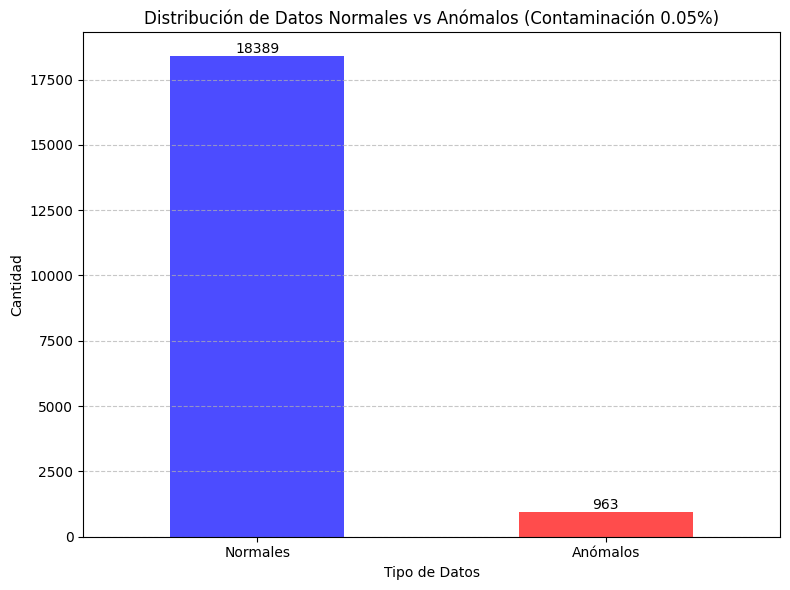

In [27]:
# Crear el gráfico de barras
plt.figure(figsize=(8, 6))
ax = resumen.plot(kind='bar', color=['blue', 'red'], alpha=0.7)

# Agregar el valor en la parte superior de cada barra
for p in ax.patches:
    ax.annotate(
        str(int(p.get_height())),  # Valor de la barra
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Posición del texto
        ha='center', va='bottom', fontsize=10, color='black'
    )

# Personalizar el gráfico
plt.title(f'Distribución de Datos Normales vs Anómalos (Contaminación {contamination_level}%)')
plt.ylabel('Cantidad')
plt.xlabel('Tipo de Datos')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [28]:
import plotly.graph_objects as go
import numpy as np
import matplotlib.cm as cm

# Crear un mapa de colores basado en los días de la semana
colores = cm.rainbow(np.linspace(0, 1, 7))
dias_semana_colores = {i + 1: f'rgba({int(c[0]*255)}, {int(c[1]*255)}, {int(c[2]*255)}, {c[3]})' for i, c in enumerate(colores)}

# Crear la figura
fig = go.Figure()

# Graficar Z-Score
fig.add_trace(go.Scatter(
    x=df.index,
    y=df['INUT'],
    mode='lines',
    name='INUT',
    line=dict(color='blue')
))

# Graficar las anomalías separadas por día de la semana
anomalias = df[df['Anomalia_'+name_isolation]==1]
for dia, color in dias_semana_colores.items():
    subset_anomalias = anomalias[anomalias['DiaSemana'] == dia]
    nombre_dia = nombres_dias[dia - 1]  # Obtener el nombre del día
    fig.add_trace(go.Scatter(
        x=subset_anomalias.index,
        y=subset_anomalias['INUT'],
        mode='markers',
        name=f'Anomalías {nombre_dia}',
        marker=dict(color=color, size=8)
    ))


# Configurar el layout
fig.update_layout(
    title=f'Detección de Anomalías en INUT (Isotation Forest cont={contamination_level})',
    xaxis_title='Índice de Tiempo',
    yaxis_title='Isolation Forest (INUT)',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    template='plotly_white'
)

# Mostrar el gráfico
fig.show()

In [29]:
# Repite los pasos anteriores con el parámetro de contamination en 1%
contamination_level=0.01
name_isolation='IF_2'
df = aplicar_isolation_forest(df, columnas_analisis, contamination_level,name_isolation)


In [30]:
# Agrega las columnas de puntaje y si es dato anómalo o no en el dataframe

## Lo solicitado lo respecto a agregar las columnas, estas se agregaron en el cuadro anterior

## especificamente con
##    df['Puntaje_Anomalia'] = isolation_forest.fit_predict(df[columnas_analisis])
##    df['Score_IF'] = isolation_forest.decision_function(df[columnas_analisis])
## Si es dato anómalo o no en el dataframe 
##  df['Anomalia_IF'] = df['Puntaje_Anomalia'].apply(lambda x: 1 if x == -1 else 0)

## de acuerdo a lo procesado se presenta el resultado de los datos en el dataframe  Anomalos o normales ('No anomañlos)
resumen = df['Anomalia_'+name_isolation].value_counts().rename({0: 'Normales', 1: 'Anómalos'})
print(resumen)

Normales    19163
Anómalos      189
Name: Anomalia_IF_2, dtype: int64


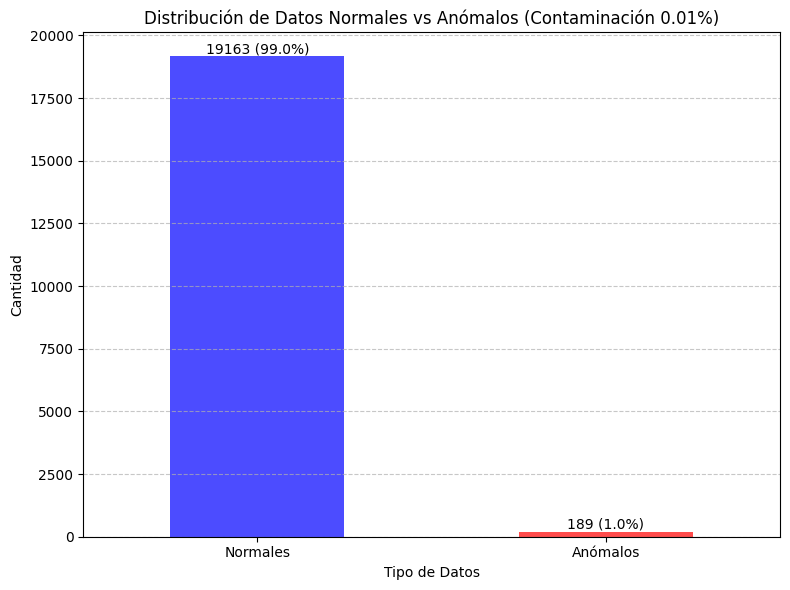

In [31]:

import matplotlib.pyplot as plt

# Crear el gráfico de barras
plt.figure(figsize=(8, 6))
ax = resumen.plot(kind='bar', color=['blue', 'red'], alpha=0.7)

# Calcular el total de datos
total = resumen.sum()

# Agregar el valor y el porcentaje en la parte superior de cada barra
for p in ax.patches:
    height = p.get_height()
    percentage = (height / total) * 100  # Calcular el porcentaje
    ax.annotate(
        f'{int(height)} ({percentage:.1f}%)',  # Valor + porcentaje
        (p.get_x() + p.get_width() / 2., height),  # Posición del texto
        ha='center', va='bottom', fontsize=10, color='black'
    )

# Personalizar el gráfico
plt.title(f'Distribución de Datos Normales vs Anómalos (Contaminación {contamination_level}%)')
plt.ylabel('Cantidad')
plt.xlabel('Tipo de Datos')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [32]:
# Crear la figura
fig = go.Figure()

# Graficar Z-Score
fig.add_trace(go.Scatter(
    x=df.index,
    y=df['INUT'],
    mode='lines',
    name='INUT',
    line=dict(color='blue')
))

# Graficar las anomalías separadas por día de la semana
anomalias = df[df['Anomalia_'+name_isolation]==1]
for dia, color in dias_semana_colores.items():
    subset_anomalias = anomalias[anomalias['DiaSemana'] == dia]
    nombre_dia = nombres_dias[dia - 1]  # Obtener el nombre del día
    fig.add_trace(go.Scatter(
        x=subset_anomalias.index,
        y=subset_anomalias['INUT'],
        mode='markers',
        name=f'Anomalías {nombre_dia}',
        marker=dict(color=color, size=8)
    ))


# Configurar el layout
fig.update_layout(
    title=f'Detección de Anomalías en INUT (Isotation Forest cont={contamination_level})',
    xaxis_title='Índice de Tiempo',
    yaxis_title='Isolation Forest (INUT)',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    template='plotly_white'
)

# Mostrar el gráfico
fig.show()

## Local Outlier Factor

In [33]:
# Vamos a aplicar la técnica de detección de anomalías de Local Outlier Factor


## Importamos LocalOutlierFactor
from sklearn.neighbors import LocalOutlierFactor


## Definimos la función para aplicar Local Outlier Factort (LOF)y agregar resultados al DataFrame

def aplicar_lof(df, columnas_analisis, n_neighbors=4, contamination=0.01):
## Configuraración del modelo LOF
    lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)
    
    ## Para predecir anomalías y puntajes
    df['Puntaje_LOF'] = lof.fit_predict(df[columnas_analisis])
    df['Score_LOF'] = lof.negative_outlier_factor_
    
    # igual que en los otros modelos se etiqueta como 1 (anómalo) o 0 (normal) 
    df['Anomalia_LOF'] = df['Puntaje_LOF'].apply(lambda x: 1 if x == -1 else 0)
    
    return df

# Seleccionamos las columnas para análisis
columnas_analisis = ['INUT']

# Asegurarnos de que no haya valores nulos
df = df.dropna(subset=columnas_analisis)

# Se aplica LOF al dataset
df = aplicar_lof(df, columnas_analisis)

# Presentamos un resumen de los datos normales y anómalos
resumen_lof = df['Anomalia_LOF'].value_counts().rename({0: 'Normales', 1: 'Anómalos'})
print(resumen_lof)

Normales    19158
Anómalos      194
Name: Anomalia_LOF, dtype: int64


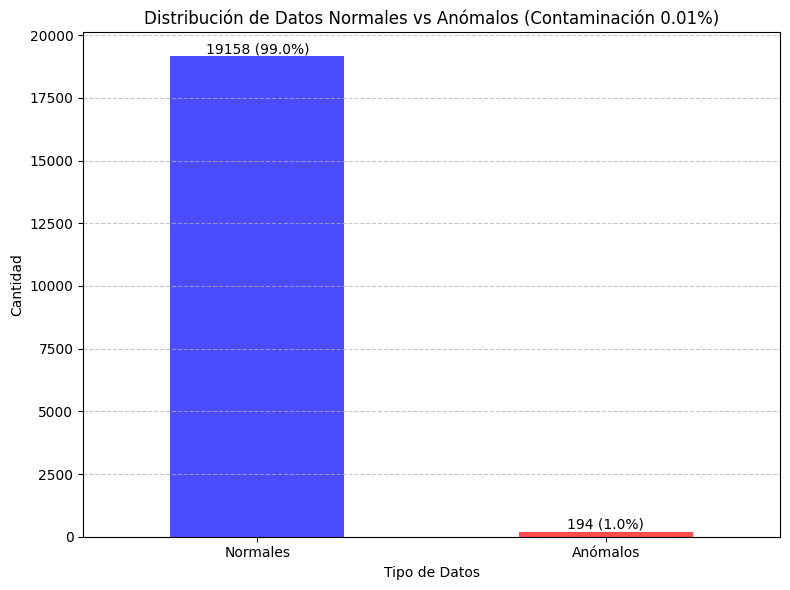

In [34]:
import matplotlib.pyplot as plt

# Crear el gráfico de barras
plt.figure(figsize=(8, 6))
ax = resumen_lof.plot(kind='bar', color=['blue', 'red'], alpha=0.7)

# Calcular el total de datos
total = resumen_lof.sum()

# Agregar el valor y el porcentaje en la parte superior de cada barra
for p in ax.patches:
    height = p.get_height()
    percentage = (height / total) * 100  # Calcular el porcentaje
    ax.annotate(
        f'{int(height)} ({percentage:.1f}%)',  # Valor + porcentaje
        (p.get_x() + p.get_width() / 2., height),  # Posición del texto
        ha='center', va='bottom', fontsize=10, color='black'
    )

# Personalizar el gráfico
plt.title(f'Distribución de Datos Normales vs Anómalos (Contaminación {contamination_level}%)')
plt.ylabel('Cantidad')
plt.xlabel('Tipo de Datos')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [35]:
# Crear la figura
fig = go.Figure()

# Graficar Z-Score
fig.add_trace(go.Scatter(
    x=df.index,
    y=df['INUT'],
    mode='lines',
    name='INUT',
    line=dict(color='blue')
))

# Graficar las anomalías separadas por día de la semana
anomalias = df[df['Anomalia_LOF']==1]
for dia, color in dias_semana_colores.items():
    subset_anomalias = anomalias[anomalias['DiaSemana'] == dia]
    nombre_dia = nombres_dias[dia - 1]  # Obtener el nombre del día
    fig.add_trace(go.Scatter(
        x=subset_anomalias.index,
        y=subset_anomalias['INUT'],
        mode='markers',
        name=f'Anomalías {nombre_dia}',
        marker=dict(color=color, size=8)
    ))


# Configurar el layout
fig.update_layout(
    title=f'Detección de Anomalías en INUT (LOF))',
    xaxis_title='Índice de Tiempo',
    yaxis_title='Isolation Forest (INUT)',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    template='plotly_white'
)

# Mostrar el gráfico
fig.show()

## Análisis

In [36]:
# Principal indidente.

# Encuentra el índice de la fila con el valor máximo en INUT
indice_max = df['INUT'].idxmax()

# Selecciona la fila del máximo, la anterior y la posterior
fila_anterior = df.iloc[indice_max - 1] if indice_max > 0 else None
fila_maxima = df.iloc[indice_max]
fila_posterior = df.iloc[indice_max + 1] if indice_max < len(df) - 1 else None

# Crea un nuevo DataFrame con estas filas
filas = []
if fila_anterior is not None:
    filas.append(fila_anterior)
filas.append(fila_maxima)
if fila_posterior is not None:
    filas.append(fila_posterior)

resumen_evento_df = pd.DataFrame(filas)


resumen_evento_df.head()[df.columns[:11]]

,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
3887,2019-08-11 22:15:00,190.1,0.0,190.8,124.9,1.3,156.1,189.8,189.5,381.0,141.6
3888,2019-08-11 22:30:00,190.2,0.0,192.6,140.1,1.6,153.6,190.4,190.4,382.8,145.8
3889,2019-08-12 00:35:00,236.1,235.3,236.3,84.1,69.9,121.4,408.2,407.3,410.8,45.6


In [37]:
columnas_finales=['Anomalia', 'Anomalia_Z','Anomalia_IF_1','Anomalia_IF_2', 'Anomalia_LOF']


df['Anomalia'] = df['Anomalia'].astype(int)
df['Anomalia_Z'] = df['Anomalia_Z'].astype(int)

resumen_anomalias= df[columnas_finales]

resumen_anomalias = resumen_anomalias.copy()
resumen_anomalias['Conjunta_de_Predicciones'] = resumen_anomalias.all(axis=1).astype(int)

resumen_anomalias.tail()


,Anomalia,Anomalia_Z,Anomalia_IF_1,Anomalia_IF_2,Anomalia_LOF,Conjunta_de_Predicciones
19347,0,0,0,0,0,0
19348,0,0,0,0,0,0
19349,0,0,0,0,0,0
19350,0,0,0,0,0,0
19351,0,0,0,0,0,0


In [38]:
nuevos_nombres = ['T.Anomalias Media Movil', 'T.Anomalias Z-Score', 'T.Anomalias Isolation Forest 0.05', 'T.Anomalias Isolation Forest 0.01', 'T.Anomalias LOF','Conjunta_de_Predicciones']
# Calcula la suma de las columnas del DataFrame original
suma_columnas = resumen_anomalias.sum(axis=0)
resumen_final = pd.DataFrame([suma_columnas.values], columns=nuevos_nombres)

resumen_final.head()

,T.Anomalias Media Movil,T.Anomalias Z-Score,T.Anomalias Isolation Forest 0.05,T.Anomalias Isolation Forest 0.01,T.Anomalias LOF,Conjunta_de_Predicciones
0,53,72,963,189,194,11


En el trabajo hemos aplicado distintas tecnicas de deteccion de anomalias en un data set procedente posiblemente de substaciones electricas de baja tension en una red de distribucion. El principal datos que se ha estudiado ha sido la Corriente Neutra (INUT). El monitoreo y análisis de la corriente neutra en una subestación eléctrica es esencial para:

- Identificar y mitigar desequilibrios y armónicos.
- Garantizar la calidad y seguridad del suministro eléctrico.
- Optimizar el desempeño del sistema y prolongar la vida útil de los equipos.


El analisis de los datos del data set revelaron:

1.- **Anomalias por Existencia de periodos de falta de medida**, en concreto se detectaron 60 periodos mayores de 1 hora sin datos de los equipos IoT. Esta circunstancia es habitual en los actuales Sistemas de Metering y pueden ser debidas a (1) falla general del emplezamiento, (2) falla del meter en la adquisicion fisica o (3) fallo en la comunicacion de la informacion 15' (no todos los sistemas despleagos en campo tienen capacidade de datalogger).

2.- **Anomalias por comision / puesto en funcionamiento del emplazamiento**. Los datos iniciales registran una larga serie inicial de datos con Corriente de Neutro a 0 y valores positivos de voltaje. El equilibrio trifasico en estos datos es consistente con una conexion sin cargas iniciales.

3.- **Anomalias por desequilibrio trifasico**: estas indicencias se caracterizan por un valor elevado del neutro que puede desembocar en la caida total del suministro en una o todas las fases. Un posible ejemplo de esta situacion se situa entorno al valor *3888* de la serie. Un valor bajo o nulo de la Corriente Neutra no siempre se debe considerar indicencia. Verificamos la desviacion de la INUT frente a la media de las intensidades porcionadas en los datos e identificamos que todos los valores marcados como posibles anomalias segun la Media Movil, correspondian con desciaciones mayores del 15%.

4.- La mayoria de las posibles incidencias se produjeron entre Domimgo y Lunes, que es consistente con mayores consumos al inicio de la semana.

El resumen del numero de anomalos por tecnica es el siguiente:

In [39]:
resumen_final.head()

,T.Anomalias Media Movil,T.Anomalias Z-Score,T.Anomalias Isolation Forest 0.05,T.Anomalias Isolation Forest 0.01,T.Anomalias LOF,Conjunta_de_Predicciones
0,53,72,963,189,194,11


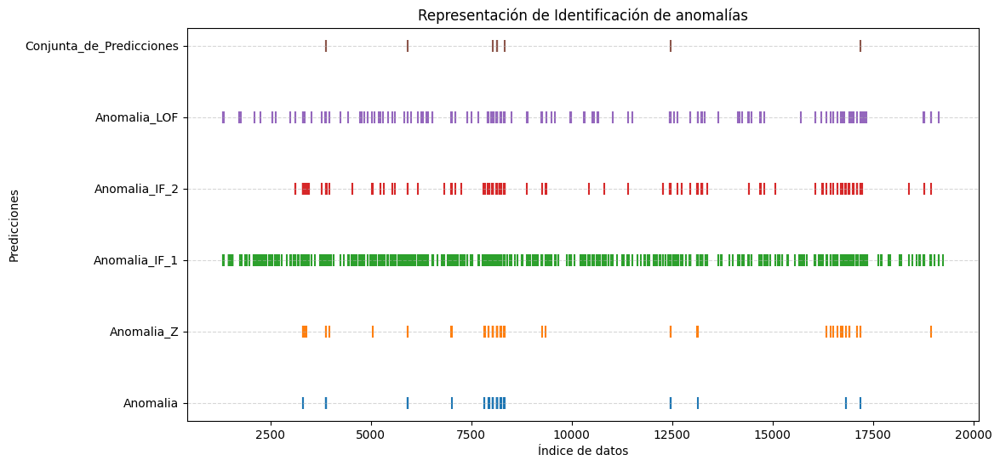

In [40]:
import matplotlib.pyplot as plt

# Configuración del gráfico
plt.figure(figsize=(12, 6))

# Dibujar las líneas para cada columna del DataFrame
for i, col in enumerate(resumen_anomalias.columns):
    y_pos = i * 2  # Espaciado vertical entre líneas
    # Filtrar solo los valores donde el dato es 1
    indices = resumen_anomalias[resumen_anomalias[col] == 1].index
    plt.scatter(indices, [y_pos] * len(indices), label=col, marker='|', s=100)

# Ajustes del gráfico
plt.yticks([i * 2 for i in range(len(resumen_anomalias.columns))], resumen_anomalias.columns)
plt.xlabel("Índice de datos")
plt.ylabel("Predicciones")
plt.title("Representación de Identificación de anomalías")

plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.show()

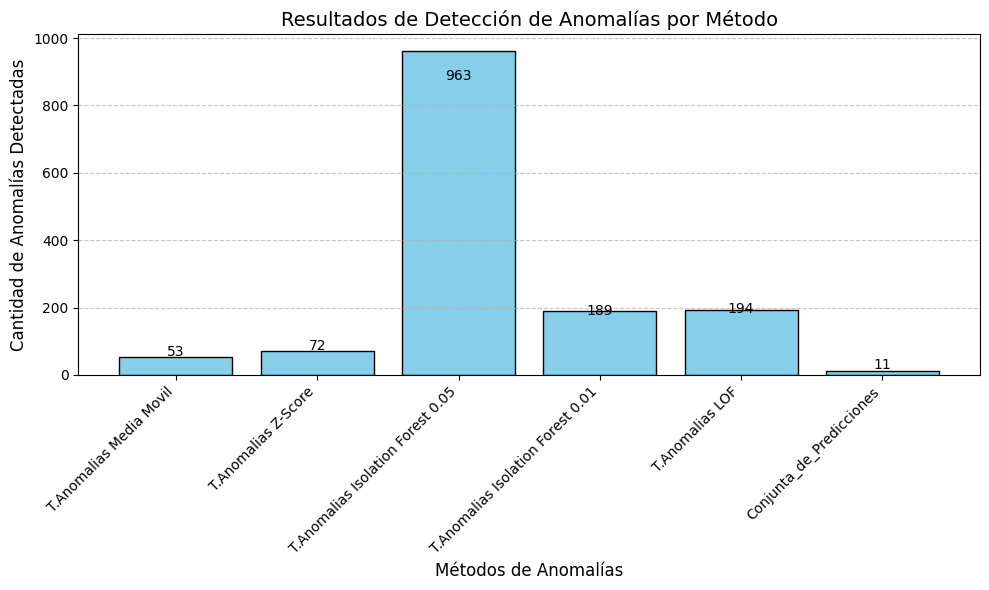

In [41]:
# Suponiendo que el DataFrame resumen_final tiene las columnas y valores correctos
columnas = resumen_final.columns
valores = resumen_final.iloc[0].values  # Obtener los valores de la primera fila

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
barras = plt.bar(columnas, valores, color='skyblue', edgecolor='black')

# Agregar los números dentro de las barras
for barra in barras:
    altura = barra.get_height()
    plt.text(barra.get_x() + barra.get_width() / 2, altura - altura * 0.1,  # Coordenadas del texto
             f'{int(altura)}',  # Convertir el valor a entero y ponerlo como texto
             ha='center', va='bottom', fontsize=10, color='black')

# Configuración del gráfico
plt.xlabel('Métodos de Anomalías', fontsize=12)
plt.ylabel('Cantidad de Anomalías Detectadas', fontsize=12)
plt.title('Resultados de Detección de Anomalías por Método', fontsize=14)
plt.xticks(rotation=45, ha='right')  # Rotar etiquetas del eje X
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Mostrar el gráfico
plt.show()

**T.Anomalias Media Movil**: se opto por una ventana de 4 medidas de 15 minutos (1 hora). Hemos considerado incidencia cuando el valor de INUT se situaba mas alla de media movil(inter=4) + 3 veces signma. No hemos establecido umbar inferior, es valor no siempre es consitutivo de incidencia. El resultado global han sido 53 posibles anomalias. El metodo de la media movil es muy util en el estudio de las anomalias locales ya que considera en entorno local de una venta de 4 medidas y puede evolucionar con la evolucion normal de la medida.

**T.Anomalias Z-Score**: en este caso se opto por un z_umbral de 3 veces sigma. Esta media es de caracter global y se adapta peor a las fuctuaciones locales de la medida evaluada. En este caso obtuvimos un total de anomalias de 72, un poco mayor al valor anterior por la diferencia con la media movil del anterior ejemplo. Esta media puede ser de menor precision en este caso.

**T.Anomalias Isolation Forest**: para este metodo se empleron ruidos de 0.05 y 0.01. En el primer caso el numero de posibles anomalias fue muy alto (**963**)ya que gran cantidad de medidas con valores cercanos a INUT=0 fueron marcados como anomalias. En el segundo caso este valor se redujo considerablemente (**189**) aunque todavia era superior al doble del numero indicado por las medidas anteriones. Dejando a parte el numero de los valores bajos, Isolation Forest no es ideal para valores altos que no se mantienen en el tiempo porque carece de un análisis temporal y depende únicamente del aislamiento espacial en un contexto estático. Adicionalmente, la aplicacion de esta tecnica a un espacio unidimmensional reduce su efectividad.

**T.Anomalias LOF**: durante la aplicacion de este medodo empleamos una vecidad de 4 y un nivel de ruido 0.01. El numero total de anomalias fue simular al Isolation Forest anterior (**194**), tambien muy alejado de los valores de las dos tecnicas iniciales. LOF presenta tambien limitaciones para el tratamiento temporal.

5.- El numero total de anomalias que fueron detectadas de forma conjunta por todos los metodos se reducen **11**. Son estas las que deberian ser estudiadas inicialmente.

## Artículos de investigación

## Artículo 1: A comparative study on outlier detection techniques for noisy production data from unconventional shale reservoirs

APA:Jha, H. S., Khanal, A., Seikh, H. M. D., & Lee, W. J. (2022). A comparative study on outlier detection techniques for noisy production data from unconventional shale reservoirs. Journal of Natural Gas Science and Engineering, 105, 104720.

Enlace:[Acceder al artículo](https://www.sciencedirect.com/science/article/pii/S1875510022003080?casa_token=l4vHkxbL1NoAAAAA:UWqPd-Lz84NmcPgAccXk-TD4BvNUt3P2TcsaZb3Et7-Z89h7p-I4bazWcTLroPxoI5z1x0oA-c0)

---

### Objetivo del Estudio
El objetivo principal del estudio es comparar y evaluar la eficacia de diferentes técnicas de detección de anomalías (outliers) aplicadas a datos de producción de hidrocarburos provenientes de reservorios no convencionales (se refiere a formaciones de roca como lutitas (shale)). Estos datos suelen estar contaminados con ruido debido a factores operativos y condiciones de flujo complejas. La eliminación de los outliers mejora la precisión en la estimación de las reservas, el análisis transitorio de tasas (RTA) y la previsión de la producción.

---

### Técnicas de Detección de Anomalías
Estas técnicas se centran en métodos estadísticos, geométricos y de machine learning, excluyendo el uso de redes neuronales profundas.

#### 1. Isolation Forest (IF)
El Isolation Forest (IF) es una técnica de machine learning no supervisada que aísla puntos de datos atípicos utilizando árboles de decisión. Este método utiliza la longitud promedio de las rutas de los árboles para clasificar los outliers.

En IF mostró un desempeño intermedio en términos de detección de outliers. Fue capaz de identificar correctamente solo el 37% de los outliers. Su ventaja principal es la eficiencia computacional, pero tiene dificultades para manejar conjuntos de datos con muchos outliers o variabilidad.

---

#### 2. Local Outlier Factor (LOF)
El Local Outlier Factor (LOF) mide la densidad local de los puntos de datos y clasifica un punto como outlier si su densidad local es significativamente menor que la de sus vecinos cercanos.
El LOF mostró un desempeño razonable en la detección de outliers. Identificó correctamente el 74% de los outliers, pero también clasificó incorrectamente el 16% de los inliers como outliers, lo que lo hace menos efectivo en comparación con otras técnicas como ABOD o DBOD.


<p style="text-align: center">
    <img src="https://ars.els-cdn.com/content/image/1-s2.0-S1875510022003080-gr5_lrg.jpg" alt="Imagen centrada"style="width: 50%;">
</p>
En la figura se ilustra cómo el Local Outlier Factor (LOF) detecta puntos anómalos midiendo su densidad relativa respecto a los vecinos. Los puntos con LOF mayores a 1 (en rojo) se identifican como outliers, como el destacado con LOF = 11.5302. Esta técnica respalda el objetivo del estudio al facilitar la eliminación de ruido en los datos de producción de hidrocarburos, mejorando la precisión en la estimación de reservas y el análisis transitorio de tasas (RTA).

---

### Principales Resultados
Los resultados del estudio muestran el rendimiento de cada técnica evaluada mediante las métricas de error absoluto medio (MAE), precisión, sensibilidad y F1-Score. Los resultados clave se resumen en la siguiente tabla:


| Técnica                 | MAE| ecisión | Sensibilidad | F1-Score |
|----------------------------|----------|---------------|------------------|---------------|
| Isolation Forest (IF)   | 32%      | 65%           | 37%              | 0.48          |
| Local Outlier Factor (LOF)| 20%     | 74%           | 74%              | 0.74          |


**Resultados relevantes**

1.	El Local Outlier Factor (LOF) superó al Isolation Forest (IF) en precisión y sensibilidad (74%), destacándose como la mejor opción entre los métodos clásicos para detectar outliers en datos de producción.
2.	Métodos como Z-Score y Media Móvil no son efectivos para conjuntos de datos no normales, como los de producción de hidrocarburos.
3.	Para datos de reservorios no convencionales, se recomienda utilizar técnicas avanzadas (ABOD o DBOD):
  -	ABOD: Detecta outliers basándose en la variación angular entre un punto y sus vecinos.
  -	DBOD: Identifica outliers según la distancia respecto a los puntos vecinos. 
Entre las técnicas clásicas, el LOF es la mejor opción.
4.	correcta selección de hiperparámetros (tamaño de ventana para Media Móvil y vecinos k en LOF) es crucial y debe realizarse mediante validación cruzada o inspección visual.


---


## Artículo 2: Aplicación de técnicas de aprendizaje automático (no supervisado) para la detección de anomalías en infraestructuras críticas cibernéticas (Tesis de maestría). Universidad de los Andes, Bogotá, Colombia.

APA: Pinto Rojas, Y. A. (2023). Aplicación de técnicas de aprendizaje automático (no supervisado) para la detección de anomalías en infraestructuras críticas cibernéticas.

Enlace:[Acceder al artículo](https://repositorio.uniandes.edu.co/server/api/core/bitstreams/f410198a-955c-4f30-ad56-dad254bd810e/content)

### Objetivo del Estudio

El objetivo de esta investigación fue identificar patrones, valores atípicos o anomalías relacionados con ataques cibernéticos en el tráfico de red de las Infraestructuras críticas (ICs) de las naciones. Estas infraestructuras tecnológicas o digitales son aquellas que permiten el flujo de actividades esenciales diarias como la comunicación, el suministro de alimento y el transporte, aquellas que la seguridad y defensa nacional están dispuestas a proteger. El estudio menciona que si bien existen técnicas de aprendizaje no supervisado para la detección de ataques cibernéticos en tiempo real o día cero, no han resultado del todo útiles al momento de la investigación entre otras cosas porque el tipo de datos que emplean para el entrenamiento no cuenta con casos reales de ataque sobre el que pueda aprender el algoritmo. Por ello es que el estudio mencionado tiene como objetivo mejorar la capacidad de detección aplicando técnicas de aprendizaje automático no supervisado para detectar anomalías en infraestructuras críticas cibernéticas. 

### Técnicas de Detección de Anomalías

Sobre una base de datos pre procesada de sensores industriales (SWAT) que contiene casos de ataques cibernéticos desbalanceados, se aplicaron las siguientes técnicas de detección de anomalías:

	Isolation Forest (IF) con límite de clasificación del 13%.
    
	Local outlier factor (LOF) que detectó anomalías locales y globales.
    
Para el set de datos empleado, Isolation Forest arrojó mejores resultados que Local Outlier Factors. De todas maneras se concluyó que ambas técnicas de aprendizaje resultan útiles para la protección de las ICs, aunque se requiere igualmente de técnicas más avanzadas y de la intervención de los expertos para validar resultados, dada la especificidad inherente a cada infraestructura. 